- 코드 출처 : https://opencv-python.readthedocs.io/en/latest/index.html

In [1]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from google.colab import files 

import matplotlib.pyplot as plt
plt.style.use('seaborn-white')

# 이미지 연산 (Image Operation)

- 이미지는 배열(array)로 표현가능하여 여러가지 연산 가능

- 이미지 다운로드 및 업로드

  - tree.jpg

  <img src="https://cdn.pixabay.com/photo/2020/08/22/00/24/tree-5507220_960_720.jpg" width="400">

  <sub>[이미지 출처] https://pixabay.com/ko/photos/%ED%8A%B8%EB%A6%AC-%EC%82%AC%EB%A7%89-%ED%92%8D%EA%B2%BD-%ED%86%A0%EC%A7%80-%EA%B0%80%EB%AD%84-5507220/</sub>



In [2]:
files.upload()

Saving tree.jpg to tree.jpg


{'tree.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x05\x03\x04\x04\x04\x03\x05\x04\x04\x04\x05\x05\x05\x06\x07\x0c\x08\x07\x07\x07\x07\x0f\x0b\x0b\t\x0c\x11\x0f\x12\x12\x11\x0f\x11\x11\x13\x16\x1c\x17\x13\x14\x1a\x15\x11\x11\x18!\x18\x1a\x1d\x1d\x1f\x1f\x1f\x13\x17"$"\x1e$\x1c\x1e\x1f\x1e\xff\xdb\x00C\x01\x05\x05\x05\x07\x06\x07\x0e\x08\x08\x0e\x1e\x14\x11\x14\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\x1e\xff\xc2\x00\x11\x08\x02\x86\x03\xc0\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1b\x00\x00\x02\x03\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x04\x01\x02\x05\x00\x06\x07\xff\xc4\x00\x19\x01\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\x00\x01\xf4\xe7Z\xd7\xb3\x10%\r\x0b\xe3\x8

In [3]:
tree = cv2.imread('tree.jpg')
print(tree.shape)

(646, 960, 3)


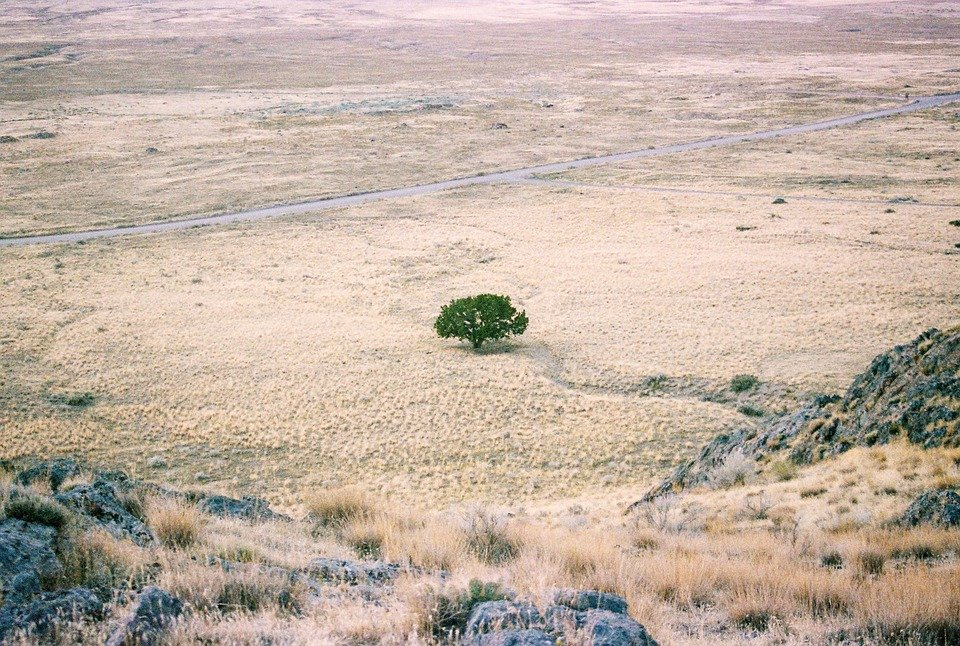

In [4]:
cv2_imshow(tree)

## Pixel Value

In [5]:
temp_px = tree[200,200]
print(temp_px)

[158 172 190]


In [6]:
temp_channel = tree[200,200,2]
print(temp_channel)

190


## 값 변경

In [7]:
tree[100, 100] = [0,0,255]
tree[101, 100] = [0,0,255]
tree[102, 100] = [0,0,255]
tree[103, 100] = [0,0,255]
tree[104, 100] = [0,0,255]

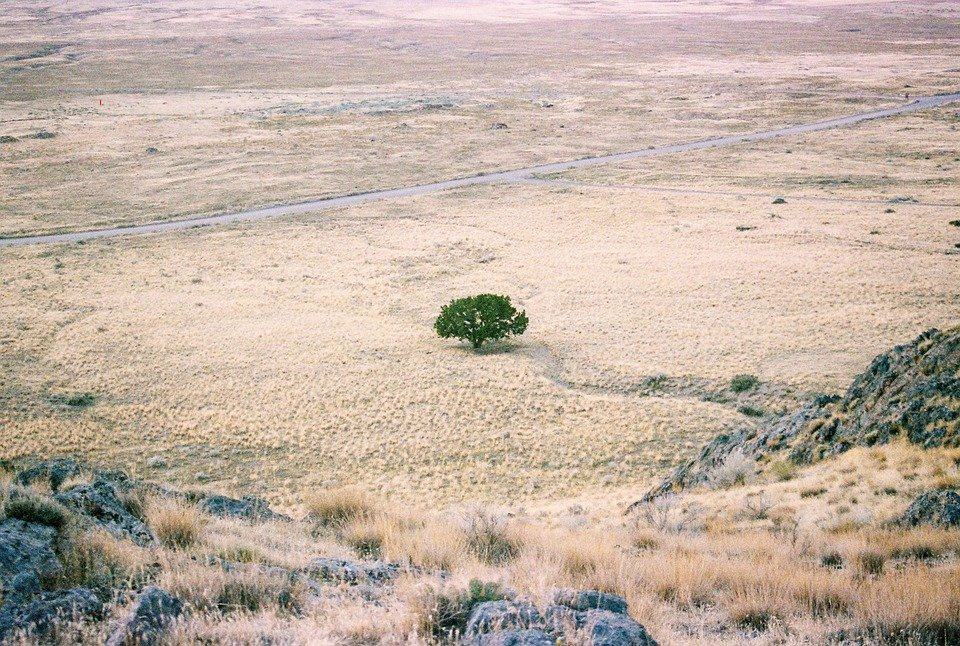

In [8]:
cv2_imshow(tree)

## 인덱싱

In [9]:
print(tree[:100, :100].shape)

(100, 100, 3)


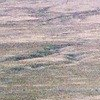

In [10]:
cv2_imshow(tree[:100, :100])

In [12]:
white_box = tree[:100, :100]
white_box = [255,255,255]
tree[:100, :100] = white_box

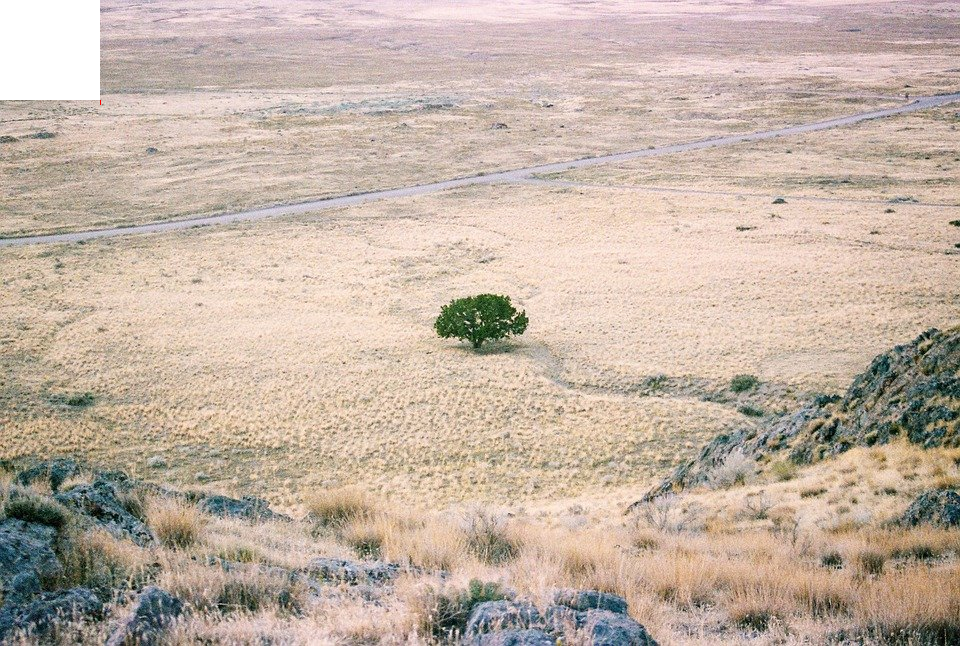

In [13]:
cv2_imshow(tree)

## 이미지 ROI

- 이미지 작업시에는 특정 pixel단위 보다는 특정 영역단위로 작업을 하게 되는데 이것을 Region of Image(ROI)라고 함
  
- ROI 설정은 Numpy의 indexing 을 사용
  
  - 특정 영역을 copy 할 수도 있음

In [14]:
tree = cv2.imread('tree.jpg')
print(tree.shape)

(646, 960, 3)


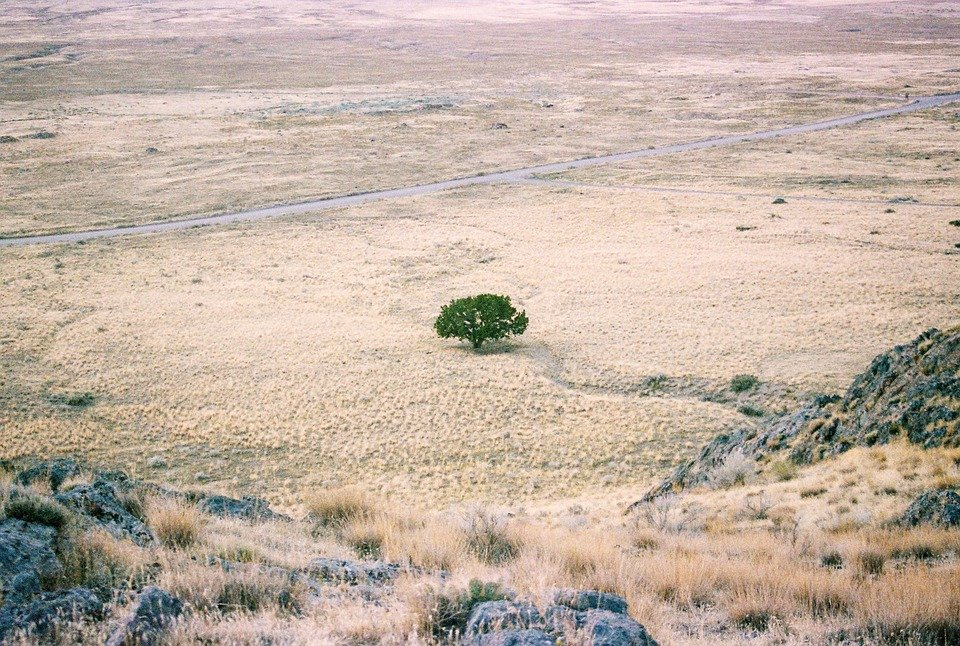

In [15]:
cv2_imshow(tree)

In [16]:
t = tree[190:240, 290:350]

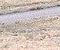

In [17]:
cv2_imshow(t)

In [18]:
tree[130:180, 310:370] = t

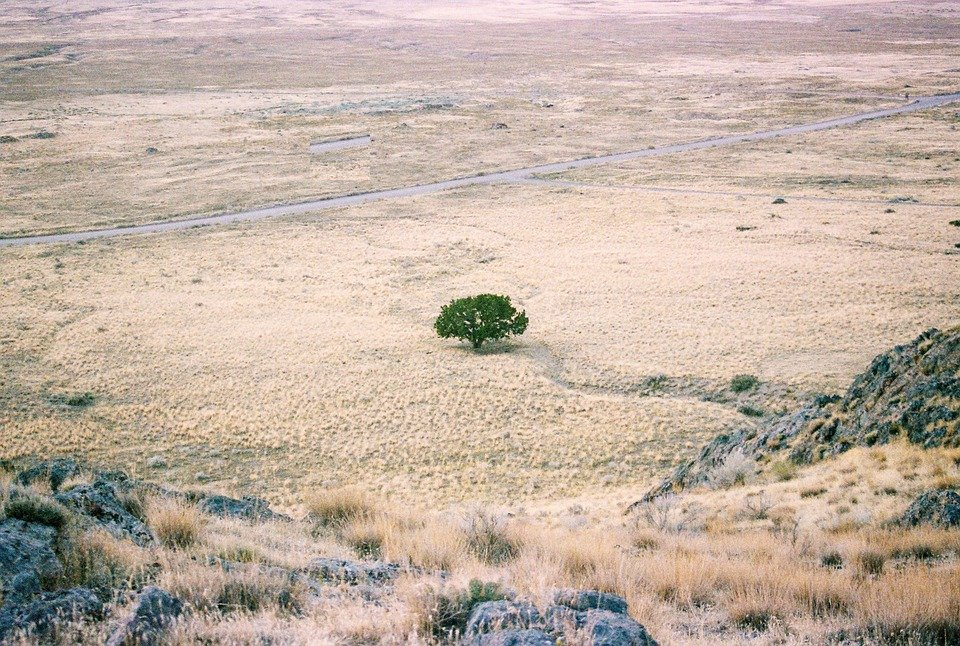

In [20]:
cv2_imshow(tree)

In [21]:
tree[200:250, 210:270] = t

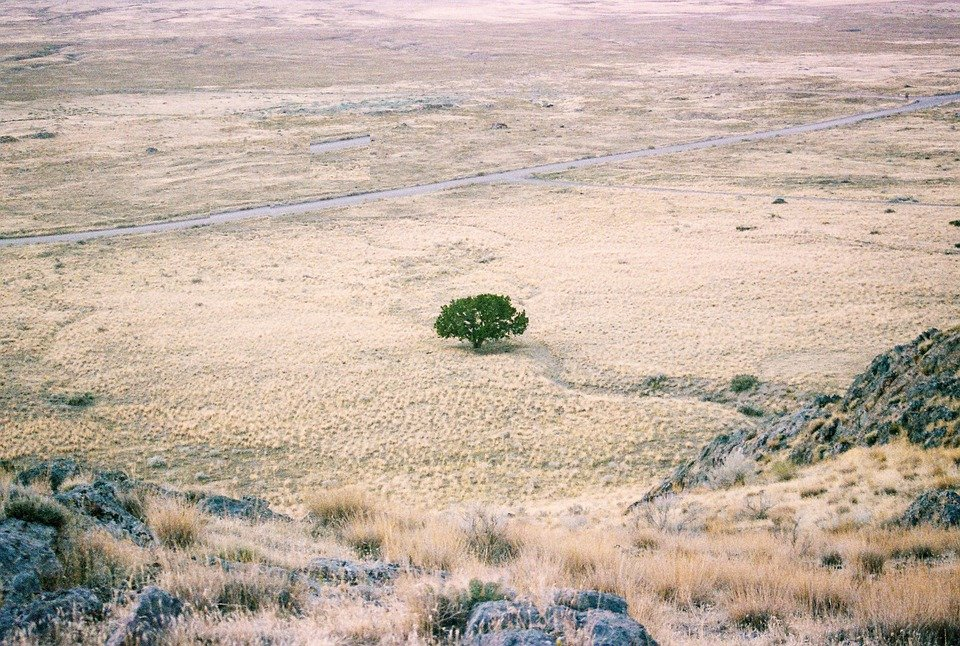

In [22]:
cv2_imshow(tree)

## 이미지의 Channels

- B, G, R로 구성된 채널을 분리, 합칠 수 있음

  - `cv2.split()`

  - `cv2.merge()`

In [23]:
b, g, r = cv2.split(tree)

In [24]:
print(b)
print(b.shape)

[[174 170 173 ... 166 175 163]
 [169 164 168 ... 167 170 167]
 [147 153 161 ... 176 163 168]
 ...
 [118 106 125 ...  16  48  20]
 [115  90  84 ...  39  33  29]
 [ 86  96  94 ...  35  16  14]]
(646, 960)


In [25]:
print(g)
print(g.shape)

[[167 163 166 ... 145 154 142]
 [161 156 160 ... 149 149 149]
 [141 147 155 ... 161 145 153]
 ...
 [ 99  91 112 ...  17  49  21]
 [ 96  75  71 ...  40  36  33]
 [ 67  81  81 ...  36  19  18]]
(646, 960)


In [26]:
print(r)
print(r.shape)

[[174 170 173 ... 177 186 174]
 [171 166 170 ... 180 181 180]
 [152 158 166 ... 189 174 181]
 ...
 [ 96  89 114 ...   8  40  11]
 [ 93  73  73 ...  31  27  22]
 [ 64  79  83 ...  27  10   7]]
(646, 960)


In [27]:
img = cv2.merge((b,g,r))


In [28]:
print(img.shape)

(646, 960, 3)


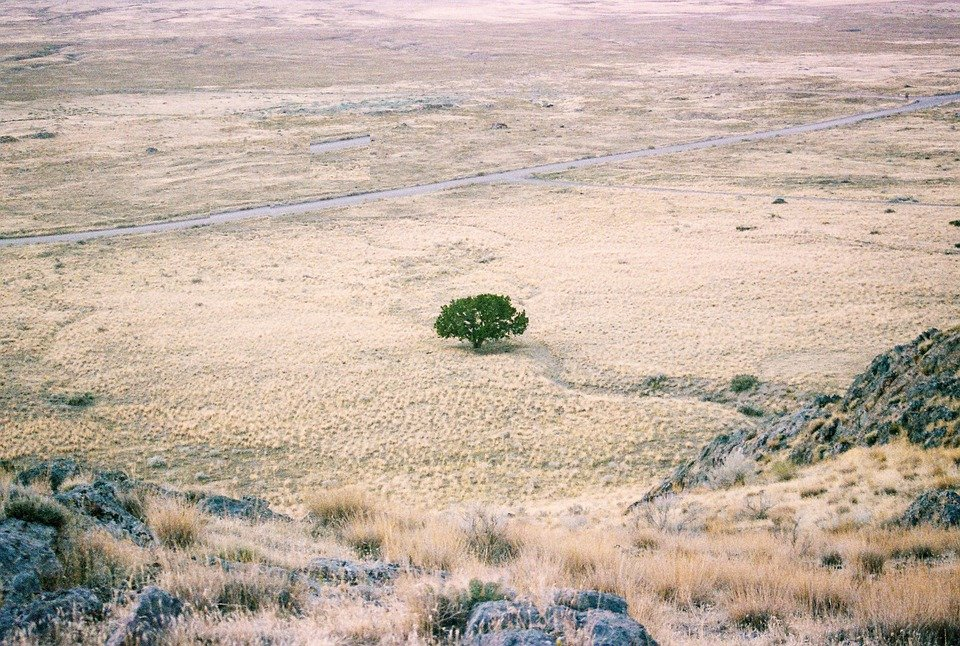

In [29]:
cv2_imshow(img)

- `cv2.split()` 함수는 비용이 많이 드는 함수이므로, 가능하다면 **Numpy indexing**을 사용하는 효율적!

- R 채널 0으로 값 변경

In [30]:
img[:, : , 2] = 0

In [31]:
print(img)

[[[174 167   0]
  [170 163   0]
  [173 166   0]
  ...
  [166 145   0]
  [175 154   0]
  [163 142   0]]

 [[169 161   0]
  [164 156   0]
  [168 160   0]
  ...
  [167 149   0]
  [170 149   0]
  [167 149   0]]

 [[147 141   0]
  [153 147   0]
  [161 155   0]
  ...
  [176 161   0]
  [163 145   0]
  [168 153   0]]

 ...

 [[118  99   0]
  [106  91   0]
  [125 112   0]
  ...
  [ 16  17   0]
  [ 48  49   0]
  [ 20  21   0]]

 [[115  96   0]
  [ 90  75   0]
  [ 84  71   0]
  ...
  [ 39  40   0]
  [ 33  36   0]
  [ 29  33   0]]

 [[ 86  67   0]
  [ 96  81   0]
  [ 94  81   0]
  ...
  [ 35  36   0]
  [ 16  19   0]
  [ 14  18   0]]]


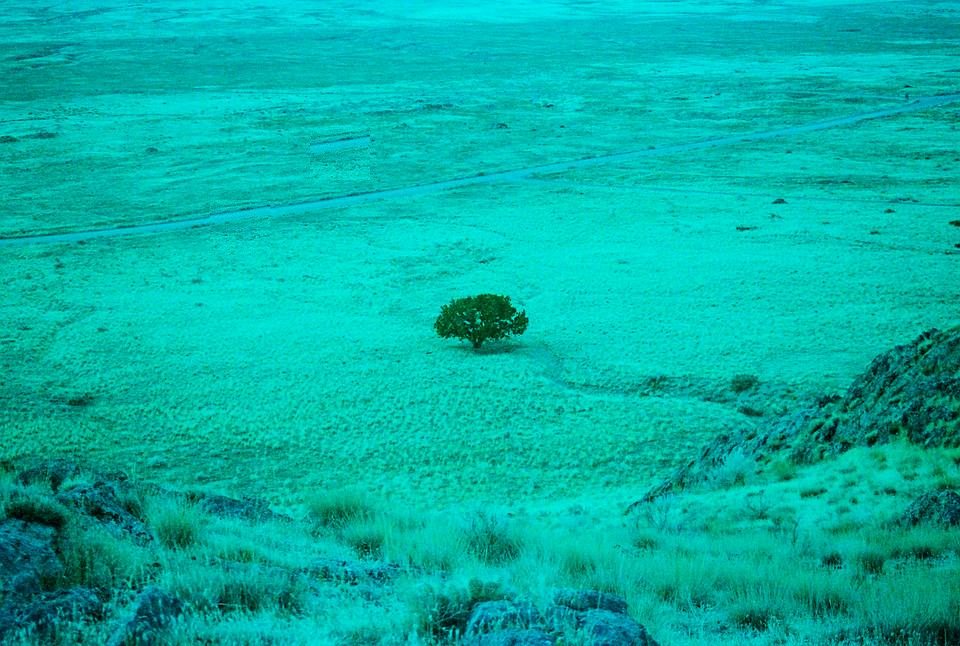

In [32]:
cv2_imshow(img)

- G 채널 255으로 값 변경

In [33]:
img[:, :, 1] = 0

In [34]:
print(img)

[[[174   0   0]
  [170   0   0]
  [173   0   0]
  ...
  [166   0   0]
  [175   0   0]
  [163   0   0]]

 [[169   0   0]
  [164   0   0]
  [168   0   0]
  ...
  [167   0   0]
  [170   0   0]
  [167   0   0]]

 [[147   0   0]
  [153   0   0]
  [161   0   0]
  ...
  [176   0   0]
  [163   0   0]
  [168   0   0]]

 ...

 [[118   0   0]
  [106   0   0]
  [125   0   0]
  ...
  [ 16   0   0]
  [ 48   0   0]
  [ 20   0   0]]

 [[115   0   0]
  [ 90   0   0]
  [ 84   0   0]
  ...
  [ 39   0   0]
  [ 33   0   0]
  [ 29   0   0]]

 [[ 86   0   0]
  [ 96   0   0]
  [ 94   0   0]
  ...
  [ 35   0   0]
  [ 16   0   0]
  [ 14   0   0]]]


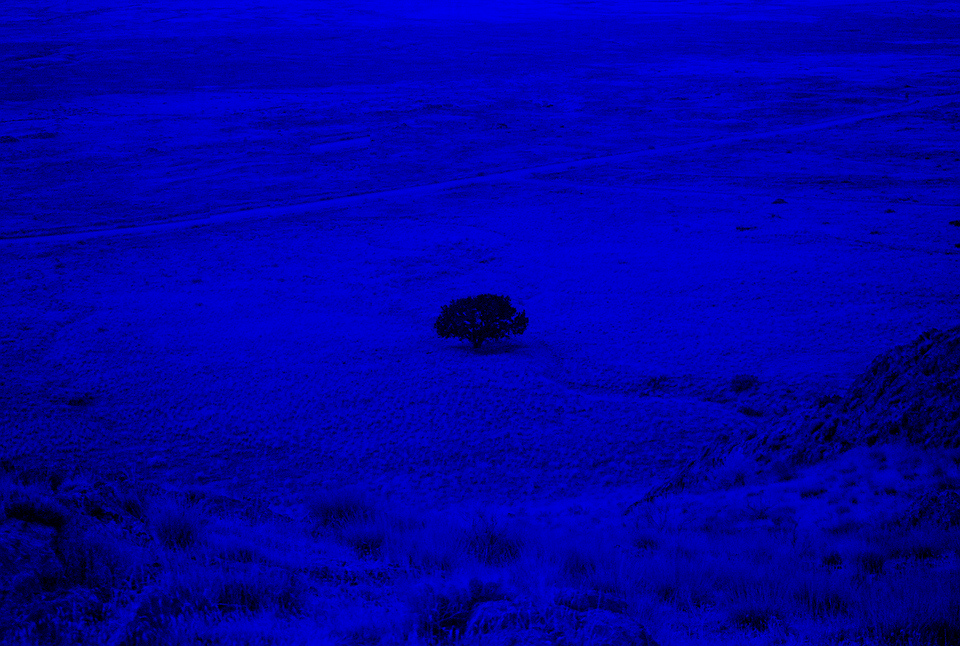

In [35]:
cv2_imshow(img)

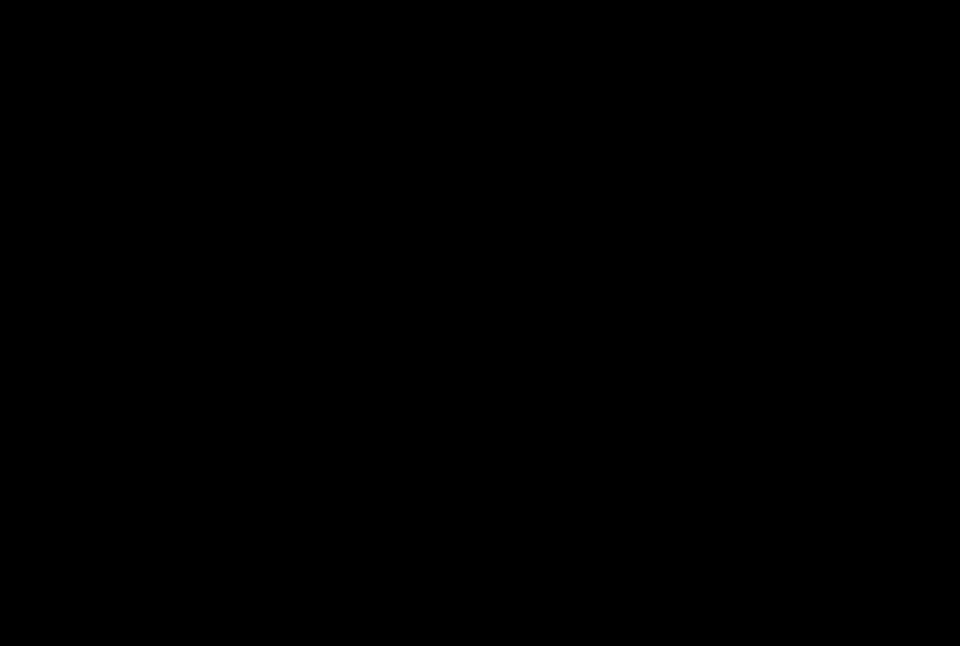

In [36]:
img[:, :, 0] = 0
cv2_imshow(img)

## 이미지 더하기
- `cv2.add()`

- `cv2.addWeighted()`

- `Numpy` 더하기 연산

- (참고) 
  - `cv2.add()` : Saturation 연산 
    - `Saturation` 연산은 한계값을 정하고 그 값을 벗어나는 경우는 모두 특정 값으로 계산하는 방식

    - 이미지에서는 0이하는 모두 0, 255이상은 모두 255로 표현
  
  - `Numpy` : modulo 연산
    - a와 b는 n으로 나눈 나머지 값이 같다라는 의미

    - 이미지에서는 연산의 결과가 256보다 큰 경우는 256으로 나눈 나머지 값으로 결정

In [37]:
x = np.uint8([250])
y = np.uint8([10])

- `cv2.add()` 연산

In [38]:
print(cv2.add(x,y))

[[255]]


- `Numpy` 연산

In [39]:
print(x+y)

[4]


- 이미지1(dog1.jpg)

  <img src="https://cdn.pixabay.com/photo/2017/09/25/13/12/dog-2785074_960_720.jpg" width="300">

  <sub>[이미지 출처] https://pixabay.com/ko/photos/%EA%B0%9C-%EC%8A%AC%ED%94%88-%EB%8C%80%EA%B8%B0-%EC%A4%91-%EC%B8%B5-2785074//</sub>

<br>

- 이미지2(dog2.jpg)

  <img src="https://cdn.pixabay.com/photo/2017/09/25/13/14/dog-2785077_960_720.jpg" width="300">

  <sub>[이미지 출처] https://pixabay.com/ko/photos/%EA%B0%9C-%EB%9D%BC%EC%82%AC-%EC%82%AC-apso-%EB%8F%99%EB%AC%BC-2785077/</sub>

In [63]:
files.upload()

Saving dog1.jpg to dog1.jpg
Saving dog2.jpg to dog2.jpg


{'dog1.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x02\x02\x02\x03\x02\x02\x02\x03\x03\x03\x03\x04\x06\x04\x04\x04\x04\x04\x08\x06\x06\x05\x06\t\x08\n\n\t\x08\t\t\n\x0c\x0f\x0c\n\x0b\x0e\x0b\t\t\r\x11\r\x0e\x0f\x10\x10\x11\x10\n\x0c\x12\x13\x12\x10\x13\x0f\x10\x10\x10\xff\xdb\x00C\x01\x03\x03\x03\x04\x03\x04\x08\x04\x04\x08\x10\x0b\t\x0b\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\xff\xc0\x00\x11\x08\x01\xab\x02\x80\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1d\x00\x00\x00\x07\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x03\x04\x05\x06\x07\x08\x01\x00\t\xff\xc4\x00G\x10\x00\x02\x01\x03\x02\x04\x05\x02\x03\x06\x04\x04\x06\x01\x02\x07\x01\x02\x03\x00\x04\x11\x05!\x06\x121A\x07\x13"Qa\x14q2\x81\x91\x08\x15#B\xa1\xb1Rb\xc1\xf0\x16$3\xd1\x17Cr\x82\xe1\xf1\x9

In [64]:
dog1 = cv2.imread('dog1.jpg', cv2.IMREAD_COLOR)
dog2 = cv2.imread('dog2.jpg', cv2.IMREAD_COLOR)

In [65]:
print(dog1.shape)
print(dog2.shape)

(427, 640, 3)
(427, 640, 3)


- `cv2.add()` 연산

In [66]:
result1 = cv2.add(dog1,dog2)

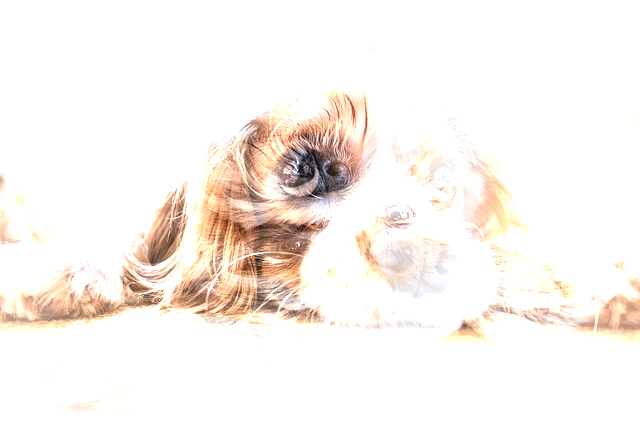

In [67]:
cv2_imshow(result1)

- `Numpy` 연산

In [69]:
result2 = dog1 + dog2

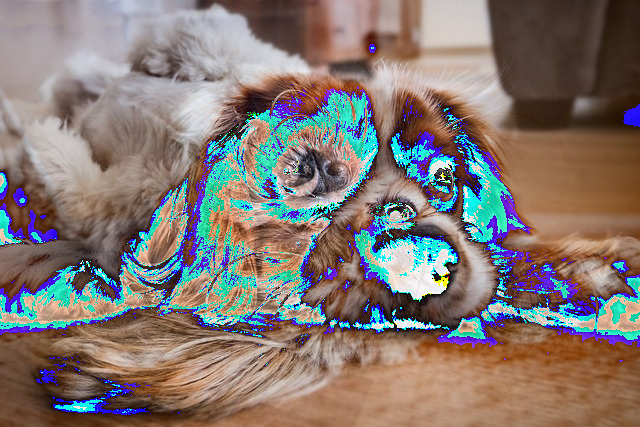

In [70]:
cv2_imshow(result2)

## 비트 연산
- AND, OR, NOT, XOR 연산
  - `bitwise_and` : 둘다 0이 아닌 경우만 값을 통과

  - `bitwise_or` : 둘중 하나가 0이 아니면 값을 통과

  - `bitwise_not` : 해당 값에 대해 부정값을 통과

  - `bitwise_xor` : 두 요소의 논리적 배타값 통과


* 이미지 다운로드

<img src="https://static.vecteezy.com/system/resources/previews/000/440/202/original/star-vector-icon.jpg" width="400">

<sub>출처: https://static.vecteezy.com/system/resources/previews/000/440/202/original/star-vector-icon.jpg</sub>




In [71]:
files.upload()

Saving star.jpg to star.jpg


{'star.jpg': b'\xff\xd8\xff\xe1\x00"Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x01\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x00\x00\x00\x00\xff\xe1\x00\x02\xff\xdb\x00\x84\x00\x03\x02\x02\x03\x02\x02\x03\x03\x03\x03\x04\x03\x03\x04\x05\x08\x05\x05\x04\x04\x05\n\x07\x07\x06\x08\x0c\n\x0c\x0c\x0b\n\x0b\x0b\r\x0e\x12\x10\r\x0e\x11\x0e\x0b\x0b\x10\x16\x10\x11\x13\x14\x15\x15\x15\x0c\x0f\x17\x18\x16\x14\x18\x12\x14\x15\x14\x01\x03\x04\x04\x05\x04\x05\t\x05\x05\t\x14\r\x0b\r\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\xff\xc2\x00\x11\x08\x14\x00\x14\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x002\x00\x01\x00\x02\x02\x02\x03\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\t\x07\n\x01\x06\x02\x04\x05\x03\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\

In [82]:
star = cv2.imread('star.jpg')
print(star.shape)

(5120, 5120, 3)


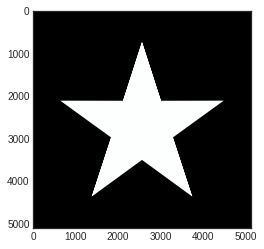

In [83]:
plt.imshow(star)
plt.show()

In [84]:
black_img = np.zeros((5120,5120, 3))

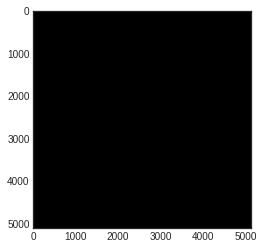

In [85]:
plt.imshow(black_img)
plt.show()

In [86]:
black_img[:, :2560, :] = (255,255,255)

In [87]:
img = black_img.astype(np.uint8)

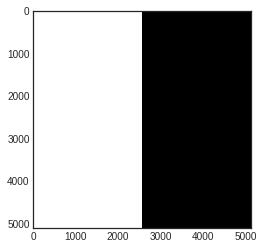

In [88]:
plt.imshow(img)
plt.show()

- 이미지의 dtype을 int형으로 변환

In [89]:
result = cv2.bitwise_and(img,star)

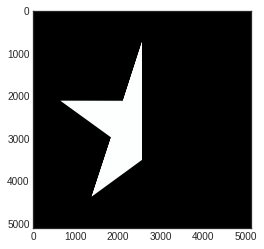

In [90]:
plt.imshow(result)
plt.show()

### bitwise_and 연산

In [91]:
result2 = cv2.bitwise_or(img,star)

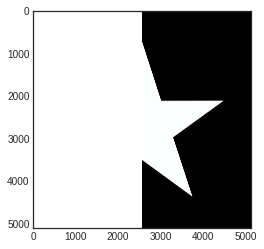

In [92]:
plt.imshow(result2)
plt.show()

### bitwise_not 연산

In [93]:
result3 = cv2.bitwise_not(img)

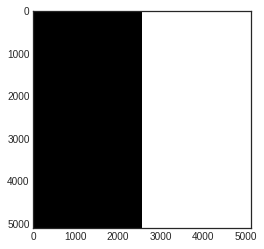

In [94]:
plt.imshow(result3)
plt.show()

In [95]:
result4 = cv2.bitwise_not(star)

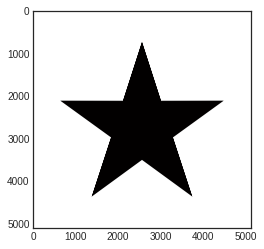

In [96]:
plt.imshow(result4)
plt.show()

### bitwise_nor 연산

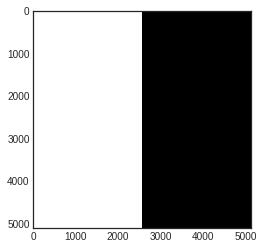

In [97]:
plt.imshow(img)
plt.show()

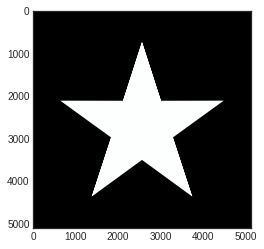

In [98]:
plt.imshow(star)
plt.show()

In [99]:
result5 = cv2.bitwise_xor(star,img)

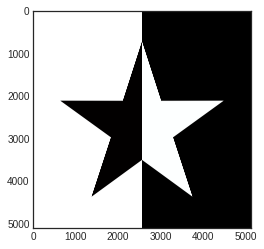

In [100]:
plt.imshow(result5)
plt.show()

In [101]:
tmp_star = cv2.bitwise_not(star)
result6 = cv2.bitwise_xor(tmp_star, img)

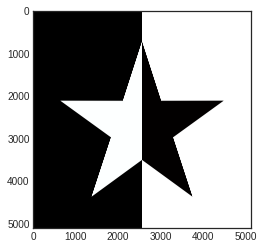

In [102]:
plt.imshow(result6)
plt.show()

### 비트 연산 예시 - lenna 이미지에 OpenCV 로고 넣기


- 이미지 (OpenCV logo)
  - https://img1.daumcdn.net/thumb/R800x0/?scode=mtistory2&fname=https%3A%2F%2Ft1.daumcdn.net%2Fcfile%2Ftistory%2F2361FF4A586B8FFE1A

  <img src="https://img1.daumcdn.net/thumb/R800x0/?scode=mtistory2&fname=https%3A%2F%2Ft1.daumcdn.net%2Fcfile%2Ftistory%2F2361FF4A586B8FFE1A" width="300">

In [104]:
files.upload()

Saving opencv_logo.jpg to opencv_logo.jpg


{'opencv_logo.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00x\x00x\x00\x00\xff\xdb\x00C\x00\x07\x05\x05\x06\x05\x04\x07\x06\x05\x06\x08\x07\x07\x08\n\x11\x0b\n\t\t\n\x15\x0f\x10\x0c\x11\x18\x15\x1a\x19\x18\x15\x18\x17\x1b\x1e\'!\x1b\x1d%\x1d\x17\x18"."%()+,+\x1a /3/*2\'*+*\xff\xdb\x00C\x01\x07\x08\x08\n\t\n\x14\x0b\x0b\x14*\x1c\x18\x1c**************************************************\xff\xc0\x00\x11\x08\x02\x05\x02I\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1d\x00\x01\x00\x02\x02\x03\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x08\x05\x06\x01\x02\x04\x03\t\xff\xc4\x00R\x10\x00\x01\x03\x03\x01\x05\x04\x04\x07\n\x0c\x05\x03\x05\x00\x00\x00\x01\x02\x03\x04\x05\x11\x06\x07\x12!1A\x08\x13Qa"q\x81\xb1\x14#2Bs\x91\xa1\x15\x16\x1856Rbrt\xd1\x17$34TV\x93\x94\xb2\xc1\xd2\xe1\'7DU\x82%S\x92cd\x83\xa2\xf1\xff\xc4\x00\x1c\x01\x01\x00\x01\x05\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x02\x04\x05\x06\x07\x01\x08\xff\xc4\x006\x11\x00\x02\x01\x03\x02\x04\x03\x07

In [105]:
logo = cv2.imread('opencv_logo.jpg')
print(logo.shape)

(517, 585, 3)


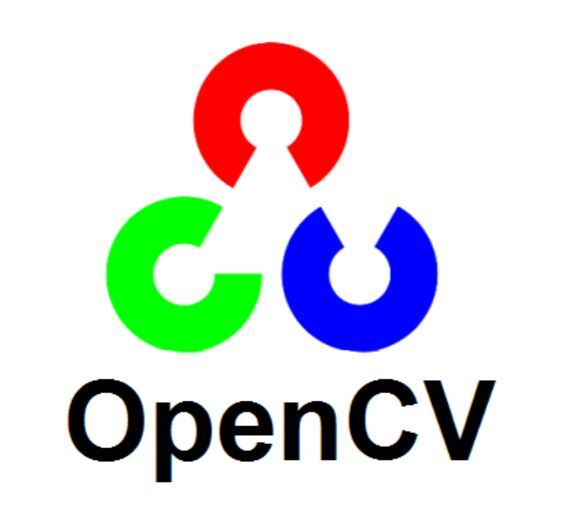

In [106]:
cv2_imshow(logo)

![](https://upload.wikimedia.org/wikipedia/ko/2/24/Lenna.png)

* https://upload.wikimedia.org/wikipedia/ko/2/24/Lenna.png

In [107]:
files.upload()

Saving Lenna.png to Lenna.png


{'Lenna.png': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x00\xdc\x00\x00\x00\xdc\x08\x06\x00\x00\x00\x1bZ\xcf\x81\x00\x00\x00\x04gAMA\x00\x00\xb1\x8f\x0b\xfca\x05\x00\x00\x00 cHRM\x00\x00z&\x00\x00\x80\x84\x00\x00\xfa\x00\x00\x00\x80\xe8\x00\x00u0\x00\x00\xea`\x00\x00:\x98\x00\x00\x17p\x9c\xbaQ<\x00\x00\x00\x06bKGD\x00\xff\x00\xff\x00\xff\xa0\xbd\xa7\x93\x00\x00\x00\x07tIME\x07\xe1\x01\n\x0c\x14#\xc6\xc2\xf4\x10\x00\x00\x80\x00IDATx\xda|\xfdY\xac\xa5Yv\xdf\x89\xfd\xd6\xda{\x7f\xdf9\xe7\x0e1dDF\xceUY\x03\x8bU,\x0e\xe2 Z2E\x8d-\xc8\x96\x07Yv\x1b\x96\x00=\xf8\xc10l\xc0\x80_\xfa\xd9\xedG\xc3\xcfm?\x180\xfc\xe4\xb6\xd1\xdd\xf0\x80\xb6\x81nw\xb3eQ&\xd9\x14IQ\x14\xa9*\xb2\xaa\xb22\xab*\xabr\x88\xf1\x0e\xe7\x9c\xef\xdb{\xaf\xe5\x87\xb5Od\x91\xa2:\x81@fF\xdc\xb8\xf7\x9c\xf3\xeda\xad\xff\xfa\x0f\xf2\xc1\xff\xe6\x7f\xe5\x0e\xa4~\x84<\xe1\xbd\xe3\xbe\xd2\xddqqT\x80zKO\x1bR\xab\x98o\x11i$ix\xd9Q\x8a\xa1*HV\xd2Tp\xeb\xa8\x19\xe6\x82]7\x96\xdb\x85\x9b}\xe1\xd9\x87O\xf9\xe8\xf9\xc2\xf5\x01\x1a\x89\

- 삽입할 이미지의 row, col, channel정보

- 대상 이미지에서 삽입할 이미지의 영역을 추출

In [109]:
lenna = cv2.imread('Lenna.png')
print(lenna.shape)

(220, 220, 3)


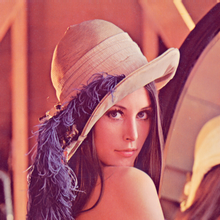

In [110]:
cv2_imshow(lenna)

In [111]:
rows, cols, channels = lenna.shape
logo = logo[0:rows, 0:cols]

In [112]:
logo.shape

(220, 220, 3)

- mask를 만들기 위해서 logo 이미지를 gray scale로 변경후 binary image로 전환

- mask는 logo부분이 흰색(255), 바탕은 검은색(0)

- mask_inv는 logo부분이 검은색(0), 바탕은 흰색(255)

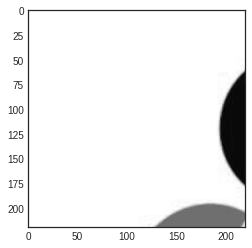

In [113]:
logo_gray = cv2.cvtColor(logo, cv2.COLOR_BGR2GRAY)
plt.imshow(logo_gray, cmap='gray')
plt.show()

In [114]:
ret, mask = cv2.threshold(logo_gray, 200, 255, cv2.THRESH_BINARY_INV)
mask_inv = cv2.bitwise_not(mask)

In [115]:
print(mask)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


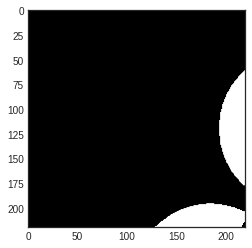

In [116]:
plt.imshow(mask, cmap='gray')
plt.show()

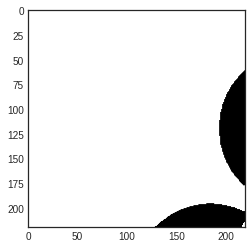

In [117]:
plt.imshow(mask_inv, cmap='gray')
plt.show()

In [119]:
img1_fg = cv2.bitwise_and(logo, logo, mask=mask)
img2_bg = cv2.bitwise_and(lenna, lenna, mask=mask_inv)

In [120]:
dst = cv2.add(img1_fg, img2_bg)

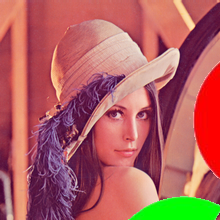

In [121]:
cv2_imshow(dst)

In [122]:
lenna[0:rows, 0:cols] = dst

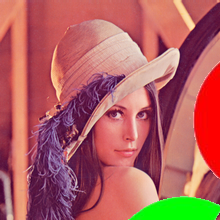

In [123]:
cv2_imshow(lenna)

## Image Blending
- `cv2.addWeighted()` 사용하여 두 이미지를 bleding 할 수 있음

- blending 하려는 두 이미지의 사이즈가 같아야함

- [Simple Formula]  
  # $\quad g(x) = (1 - \alpha) f_0(x) + \alpha f_1(x)$

  <br>

  - $\beta = 1 - \alpha$

  -  $\alpha, \beta $ 의 값을 통해 어떤 이미지를 더 강하게 드러내고, 어떤 이미지를 더 약하게 드러낼지 결정

  - $\gamma$ 추가 가능 (optional)


- do-not-copy.jpg
  
  <img src="https://mdxenglish.files.wordpress.com/2014/08/do-not-copy.jpg" width="400">

  <sub>[이미지 출처] https://mdxenglish.com/do-not-copy-2/</sub>

In [124]:
files.upload()

Saving do-not-copy.webp to do-not-copy.webp


{'do-not-copy.webp': b'RIFFh\xd6\x00\x00WEBPVP8 \\\xd6\x00\x00p\xb3\x02\x9d\x01*t\x04v\x04>\x1d\x0e\x84B!\x04\xb2j\x04\x00q,\xad\xdf\x8f\xf1\xfd3\xc7\xc1\xdf\xa0\x1e\xd2\x07\xe4|\xe2IA\xfe\xe1\xfd\xab\xfb\x1f\xf7\xaf\xee\xff\xfd6N\xf9\xe7\xf6\x9f\xef\xbf\xd5\xbf\xb1\x7f\xbb\xff\x19\xf3\xd5\xc1=+u\xeb\xef?\x89\xbf\xb9\x7f\x8f\xffA\xf3S\xfa\xff\xdb\x1f\xbe>1\xfd\xf7\xfd\xa7\xe5\xa7\xfc\x0f\x85?\x06\xfcW\xfaO\xf5\x7f\xf2\x1f\xe3\xff\xb7\xff\xff\xfb\r\xfe\xf7\xfc\x8f\xb0\xbf\xe3\xbf\xb6\xfe\xe0?\xc0\xff\x83\xffJ\xfe\xbb\xfe/\xfc\x7f\xf7/\xff\xff5_\xe3\xbf\x99\xfb\x88\xfe\xa1\xfb=\xec\x07\xf97\xf6\xcf\xfa_\xd9\xbfu\x7f\x7f\xfe\xeb\xbf\xc1~\xca{\x9b\xff\x01\xfbu\xfe\x13\xfc?\xc8\x07\xf1\x9f\xee\x7f\xf4\xff\xb2\xfe\xef\x7f\xaf\xff\xff\xf7\x8f\xff\xa7\xd8\x0f\xd0\x07\xfaG\xfc\xbf\xfb\x7f\xec=\xd8\x7f\xda\xff\xee\xffu\xff\x17\xff\x07\xd0\xef\xf3/\xf2?\xf3?\xc0~\xfe\xff\xa7\xfb\x06\xfeA\xfdo\xfd\x1f\xe5\x8f\xef\xff\xff\xff\xc0\x0f\xf9\x7f\xff\xff\xeb\xfcK\xff\x00\xffw\xff\xff\xfeg\xc1\xef\xf0\x0

- fashion.jpg

  <img src="https://cdn.pixabay.com/photo/2020/06/20/12/55/fashion-5320934_960_720.jpg">

  <sub>[이미지 출처] https://pixabay.com/illustrations/fashion-moda-girl-shoes-model-5320934/</sub>

In [125]:
files.upload()

Saving fashion.jpg to fashion.jpg


{'fashion.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x02\x02\x02\x03\x02\x02\x02\x03\x03\x03\x03\x04\x06\x04\x04\x04\x04\x04\x08\x06\x06\x05\x06\t\x08\n\n\t\x08\t\t\n\x0c\x0f\x0c\n\x0b\x0e\x0b\t\t\r\x11\r\x0e\x0f\x10\x10\x11\x10\n\x0c\x12\x13\x12\x10\x13\x0f\x10\x10\x10\xff\xdb\x00C\x01\x03\x03\x03\x04\x03\x04\x08\x04\x04\x08\x10\x0b\t\x0b\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\xff\xc0\x00\x11\x08\x02\x80\x02\x80\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1e\x00\x01\x00\x01\x04\x03\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x06\x08\t\x05\x01\x03\x04\x02\n\xff\xc4\x00`\x10\x00\x01\x04\x01\x02\x03\x04\x05\x06\t\x06\x08\n\x08\x05\x05\x01\x02\x03\x00\x04\x05\x11\x06\x07\x12!1\x13\x08AQaq"\x14\x81\x91\xa12\t\xc1\xb1R#\x15Br\x92\xd1\xa2\x823b\xc2S\x16$\xb2

In [128]:
img1 = cv2.imread('fashion.jpg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread('do-not-copy.webp')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

(640, 640, 3)


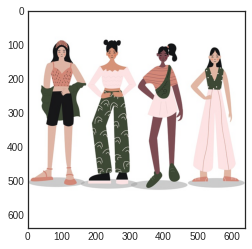

In [129]:
print(img1.shape)
plt.imshow(img1)
plt.show()

(1142, 1140, 3)


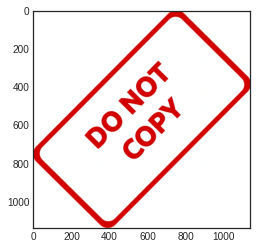

In [130]:
print(img2.shape)
plt.imshow(img2)
plt.show()

In [131]:
img1 = cv2.resize(img1, (640,640))
img2 = cv2.resize(img2, (640,640))

(640, 640, 3)


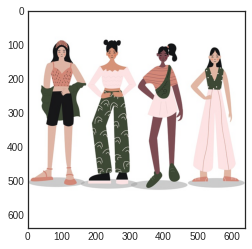

In [132]:
print(img1.shape)
plt.imshow(img1)
plt.show()

(640, 640, 3)


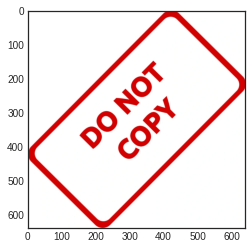

In [133]:
print(img2.shape)
plt.imshow(img2)
plt.show()

In [135]:
blended = cv2.addWeighted(src1=img1, alpha=0.5, src2=img2, beta=0.5, gamma=0)

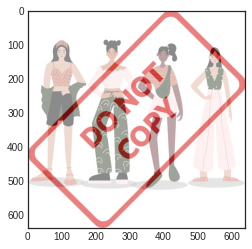

In [136]:
plt.imshow(blended)
plt.show()

In [137]:
blended2 = cv2.addWeighted(src1=img1, alpha=0.8, src2=img2, beta=0.1, gamma=0)

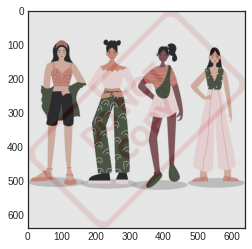

In [138]:
plt.imshow(blended2)
plt.show()